# PSF photometry of NGC 2210

> \
> *"Astronomers never seem to want to do anything easy."*
> 
> <div style="text-align: right"> - Peter B. Stetson (1987) </div>
> 

In this tutorial we will conduct some basic PSF photometry on a DESI Legacy
Survey image of the globular cluster NGC 2210. We will use the `photutils.psf`
module to perform PSF photometry on the image. Below image shows each frame of
$grz$ band and their false-color image of the NGC 2210. The aim for this 
tutorial is to get $grz$ magnitudes and colors of stars inside this field, by
PSF photometry, and to get their color-magnitude diagram for the investigation
of the properties of NGC 2210.

![](./data/proj2/NGC2210.grz.png)

* * *

## Reading lists
* PSF photometry
  * [Photutils Documentation](https://photutils.readthedocs.io/en/stable/index.html)
  * [Astronomical Observations for SNU Undergraduates - PSF Photometry](https://github.com/hbahk/SNU_AO22-1/blob/master/tutorial/notebooks/AO22-06-PSF-Photometry.ipynb)
  * [(Korean) SNU Manual - Photometry Using IRAF](http://astro.snu.ac.kr/~hhwang/Photometry_using_IRAF.pdf)
  * [NIRCam PSF Photometry](https://spacetelescope.github.io/jdat_notebooks/notebooks/psf_photometry/NIRCam_PSF_Photometry_Example.html)

For the general understanding of the processes regarding to the astronomical
photometric measurement, one can consult following references.
* General Photometry
  * [Bolte, 2015, Signal-to-Noise in Optical Astronomy](https://www.ucolick.org/~bolte/AY257/s_n.pdf)
  * [Masci, 2008, Flux-Uncertainty from Aperture Photometry](https://wise2.ipac.caltech.edu/staff/fmasci/ApPhotUncert.pdf)
  * [Chromey, 2016, To Measure the Sky](https://www.cambridge.org/highereducation/books/to-measure-the-sky/92996E5636A4EFD6562DF94AE947C908#overview)
  
If you are not familiar with handling the astronomical data, the following
tutorials may be helpful. Especially, the SNU_AOclass repository deveoloped by
[Yoonsoo P. Bach](https://github.com/ysBach), which is the TA lecture note for
astronomical observation class for SNU undergraduate students, will provide
the most of the things you need, if you concern your lack of backgrounds.
* Self-consistent general data analysis for astronomical observation
  * [SNU AO Class Python Notes](https://ysbach.github.io/SNU_AOpython/index.html) (by Yoonsoo Bach)
* Useful tutorials
  * [(Korean) Basics for the data analysis with Python](https://github.com/hbahk/SNU_AO22-1/blob/master/tutorial/notebooks/AO22-01-Basics.ipynb)
  * [Query from astronomical databases](https://github.com/hbahk/SNU_AO22-1/blob/master/tutorial/notebooks/AO22-02-Query.ipynb)
* CCD Data Handling
  * [Preprocessing](https://github.com/hbahk/SNU_AO22-1/blob/master/tutorial/notebooks/AO22-03-Preprocessing.ipynb)
  * [CCD Data Reduction Guide](https://www.astropy.org/ccd-reduction-and-photometry-guide/v/dev/index.html) (by Matthew Craig)
  

***


## PSF photometry - an overview

 PSF photometry is the process of measuring the brightness of the stars by
numerically fitting their light profile across the CCD image frame. For the
stars isolated in the frame, the aperture photometry suffices to measure their
flux and uncertainty, without any heavy computations of optimization process,
and without the possibility of failure in the model to represent the stellar
profile inside the frame. As Stetson (1987) mentioned, the aperture photmetry
is "the most easiest and potentially most accurate method for obtaining
instrumental photometry for bright, uncrowded stars, because it involves simple 
counting of detected photons." (Stetson, 1987) 
However, for stars inside the crowded field, such as open clusters, globular
clusters, and Magellanic Clouds, it is impossible to measure the brightness of
blended stars by just summing their photon counts inside some apertures. Thus
we have to adopt numerical fitting technique to model the brightness profile of
the blended stars simultaneously, under the assumption of the linearity of the
detector, and extract the total flux of a star from the model.


 PSF photometry is processed in the following steps:
1. Subtract background light from the image
2. Find stars inside the frame
3. Define a model for stellar light profile (point spread function; PSF)
4. Group the blended stars which have to be simultaneously fitted
5. Fit the light profiles of the star groups
6. Examine the residual (data - model) image to decide whether or not to ...
   - change the parameters for finding stars
   - reconstruct the PSF model
   - resize fitting window
   - iterate additional extraction in the residual
   - etc.
  
![](./data/proj2/psf_phot_overview.png)


This is the outline of this tutorial regarding to the above steps.

1. We will subtract the background of each frame using `sep` package, which is
   developed to replicate Source Extractor ([Bertin, 1996](https://ui.adsabs.harvard.edu/abs/1996A%26AS..117..393B/abstract)). Here we use `sep.Background` to
   subtract the background.

2. We will first find stars with simple method `find_peaks` from 
   `photutils.detection`. This simple
   selection of stars will provide the stars for modeling PSF. For better
   modeling of PSF, one should carefully pick the bright isolated stars,
   but here we just adopt some simple selection criteria to pick the stars,
   expecting that the adjacent stars will be eventually averaged out.

3. With the stars we picked, we derive the effective PSF (EPSF), using
   `EPSFBuilder` from `photutils.psf`. We use `photutils.psf.extract_stars` to
   make `EPSFStars` object out of the table of stars we obtained by `find_peaks`,
   then feed this object to `EPSFBuilder` to get the EPSF model. For better
   model, we can subtract the adjacent stars in the window of `EPSFStars` by
   fit them using the EPSF model, and rederive the EPSF from the 'cleaned'
   `EPSFStars`. 

4. +5. `BasicPSFPhotometry` from `photutils.psf` will subtract background,
   find stars, group them, and fit the stellar groups to conduct PSF photometry.
   What we have to do is to select the background estimator (`MMMBackground`,
   which is the same with the one in DAOPHOT), star finder (`DAOStarFinder`;
   in here we input the FWHM measured from aperture photometry of stars found
   by `find_peak`, to better performance for finding stars), fitter (`LevMarLSQFitter`), etc.

6. From `BasicPSFPhotometry` we can also obtain the residual image. In this
   image we can examine the goodness of fit, and identify some failures of the
   model (Stetson 1987):
   * images of stars which were in the frame but were not recognized by the
     star finder, perhaps due to having been blended with brighter companions
   * stars whose images contained defective pixels
   * images of galaxies which are almost but not quite, stellar
   * other similar departures from a perfect fit may be recognized and flagged

7. We will iterate 1-6. over all bands ($grz$) to get PSF photometry in
   different bands.

8. We match the stars with PSF photometry in each band. The match will be done
   by their positions. Here we just used the pixel coordinates, since the image
   we are dealing with is the cutout image from Legacy Survey so the images are
   aligned already. However, in more general case this is often not the case,
   so the match by celestial coordinates using WCS information should be better,
   otherwise you need to align the images first.

9. We will obtain colors of the matched stars and draw color-magnitude diagram
   of them, which are in the field of the NGC 2210.

10. In order to compare our PSF photometry with other results, we will use the
    photometry from the Legacy Survey catalog and the homoegeous photometric
    catalog provided by [Stetson et al. (2019)](https://ui.adsabs.harvard.edu/abs/2019MNRAS.485.3042S/abstract). To compare with the result of the latter,
    we will convert the DECam (the telescope used for DESI Legacy Survey) $gr$
    filter system to Johnson-Cousins $BV$ system.

## Caveat
The DESI Legacy Survey image we adopt here is already standard-calibrated with
each pixel in the unit of nanomaggy. In reality, you need to convert the
instrumental flux into standard flux, with the instrumental flux of standard
stars.

This tutorial is constructed with the limit of time, so this may not  be
complete and self-consistent, so if you have a question for this notebook ask
me in person or send me an email to bahkhyeonguk@gmail.com.


In [1]:
%config InlineBackend.figure_format = 'png'
# %matplotlib qt

In [3]:

%load_ext version_information
vv = %version_information numpy, matplotlib, astropy, photutils
for i, pkg in enumerate(vv.packages):
    print(f"{i} {pkg[0]:10s} {pkg[1]:s}")

0 Python     3.10.9 64bit [Clang 14.0.6 ]
1 IPython    8.11.0
2 OS         macOS 10.16 x86_64 i386 64bit
3 numpy      1.23.5
4 matplotlib 3.5.3
5 astropy    5.2.1
6 photutils  1.6.0


In [194]:

import copy
from pathlib import Path
from matplotlib import patches
from matplotlib import pyplot as plt
import numpy as np
import sys
from time import time, ctime
import warnings
from astropy.io import fits
from astropy.table import Table, hstack, vstack
from astropy.modeling.fitting import LevMarLSQFitter
from astropy.stats import sigma_clipped_stats, gaussian_fwhm_to_sigma, SigmaClip
from astropy.table import Table
from astropy.nddata import NDData, CCDData
from astropy.utils.exceptions import AstropyWarning
from astropy.visualization import simple_norm, ZScaleInterval
from photutils.aperture import CircularAperture, ApertureStats
from photutils.detection import DAOStarFinder, find_peaks
from photutils.psf import extract_stars, EPSFBuilder
from photutils.psf import DAOPhotPSFPhotometry, BasicPSFPhotometry
from photutils.psf import DAOGroup
from photutils.psf.epsf_stars import EPSFStars
from photutils.psf.utils import _extract_psf_fitting_names
from photutils.psf.utils import get_grouped_psf_model
from photutils.detection import IRAFStarFinder
from photutils.background import MMMBackground, MADStdBackgroundRMS
# from photutils.segmentation import make_source_mask
from photutils.segmentation import SegmentationImage
from photutils.segmentation import detect_threshold, detect_sources
from photutils.utils import circular_footprint
from mpl_toolkits.axes_grid1 import make_axes_locatable
import sep

sys.setrecursionlimit(10**7)
# plt.rcParams["font.family"] = 'Times New Roman'
plt.rcParams["font.size"] = 15
plt.rcParams["text.usetex"] = False
# plt.rcParams["mathtext.fontset"] = 'cm'

warnings.simplefilter('ignore', category=AstropyWarning)

WD = Path('.')
DATADIR = WD/'data'/'proj2'

## 1. Data Reading and Background Subtraction

In [203]:
def zscale_imshow(ax, img, vmin=None, vmax=None, **kwargs):
    if vmin==None or vmax==None:
        interval = ZScaleInterval()
        _vmin, _vmax = interval.get_limits(img)
        if vmin==None:
            vmin = _vmin
        if vmax==None:
            vmax = _vmax
    im = ax.imshow(img, vmin=vmin, vmax=vmax, origin='lower', **kwargs)
    
    return im

def read_sci_data(fpath, show=True, newbyteorder=False, bkgsubtract=False):
    ccd_raw = CCDData.read(fpath, unit='nmgy') # be careful about the unit!
    ccd = CCDData.read(fpath, unit='nmgy')
    
    data = ccd.data
    
    data_mean, data_med, data_std = sigma_clipped_stats(data, sigma=2.)
    ccd.mask = data < data_mean - 3*data_std 
    ccd.data[ccd.mask] = data_med
    ccd.data -= data_med
    ccd.mask = (ccd.mask) & (data > 10.)
    if newbyteorder:
        ccd.data = ccd.data.byteswap().newbyteorder()
        
    n = len(ccd.data)
    if bkgsubtract:
        bkgsubs = []
        for i in range(n):
            bkgsub = background_substraction(ccd.data[i])
            bkgsubs.append(bkgsub)
        ccd.data = np.array(bkgsubs)
    
    if show:
        fig, axes = plt.subplots(1, n, figsize=(5*n, 5))
        for i in range(n):
            im = zscale_imshow(axes[i], ccd.data[i], cmap='gray')
            divider = make_axes_locatable(axes[i])
            cax = divider.append_axes('right', size='5%', pad=0.05)
            fig.colorbar(im, cax=cax, orientation='vertical')
            
            band = ccd.header[f'BAND{i}']
            
            axes[i].text(0.98, 0.02, f'${band}$-band',
                         transform=axes[i].transAxes,
                         va='bottom', ha='right', c='k',
                         bbox=dict(boxstyle='round', facecolor='w', alpha=0.9))
            
        plt.tight_layout()
        
    return ccd, ccd_raw

def background_substraction(img, box=100, filt=3, show=True):
    sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
    threshold = detect_threshold(img, nsigma=3.0, sigma_clip=sigma_clip)
    segment_img = detect_sources(img, threshold, npixels=10)
    footprint = circular_footprint(radius=1)
    mask = segment_img.make_source_mask(footprint=footprint)
    # mask = SegmentationImage.make_source_mask(img, nsigma=2, npixels=1, dilate_size=3)
    bkg_sep = sep.Background(img.byteswap().newbyteorder(), 
                             mask=mask, bw=box, bh=box, fw=filt, fh=filt)
    bkgsub_sep = img - bkg_sep.back()
    
    if show:
        fig, axs = plt.subplots(2, 3, figsize=(10, 8))
        axs[1, 1].axis("off")
        
        data2plot = [
            dict(ax=axs[0, 0], arr=img,              title="Original data"),
            dict(ax=axs[0, 1], arr=bkg_sep.back(),   title=f"bkg (filt={filt:d}, box={box:d})"),
            dict(ax=axs[0, 2], arr=bkgsub_sep,       title="bkg subtracted"),
            dict(ax=axs[1, 0], arr=mask,             title="Mask"),
            # dict(ax=axs[1, 1], arr=bkg_sep.background_mesh,   title="bkg mesh"),
            dict(ax=axs[1, 2], arr=10*bkg_sep.rms(), title="10 * bkg RMS")
        ]
        
        for dd in data2plot:
            im = zscale_imshow(dd['ax'], dd['arr'])
            cb = fig.colorbar(im, ax=dd['ax'], orientation='horizontal')
            # cb.ax.set_xticklabels([f'{x:.3f}' for x in cb.get_ticks()])#, rotation=45)
            dd['ax'].set_title(dd['title'])
        
        plt.tight_layout()
    
    return bkgsub_sep

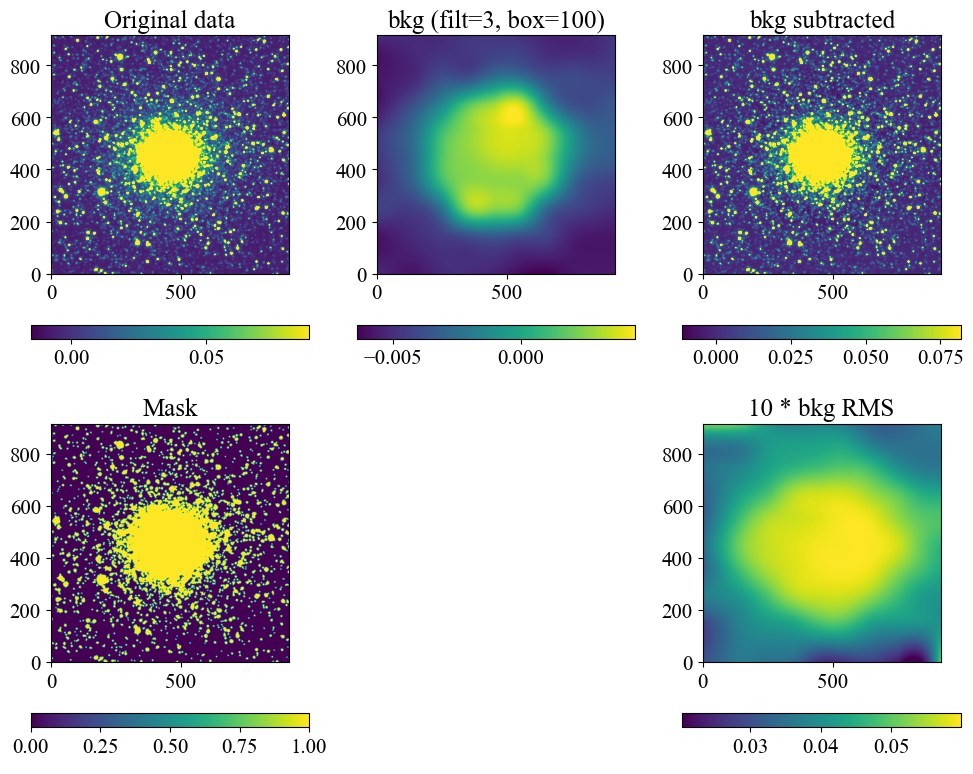

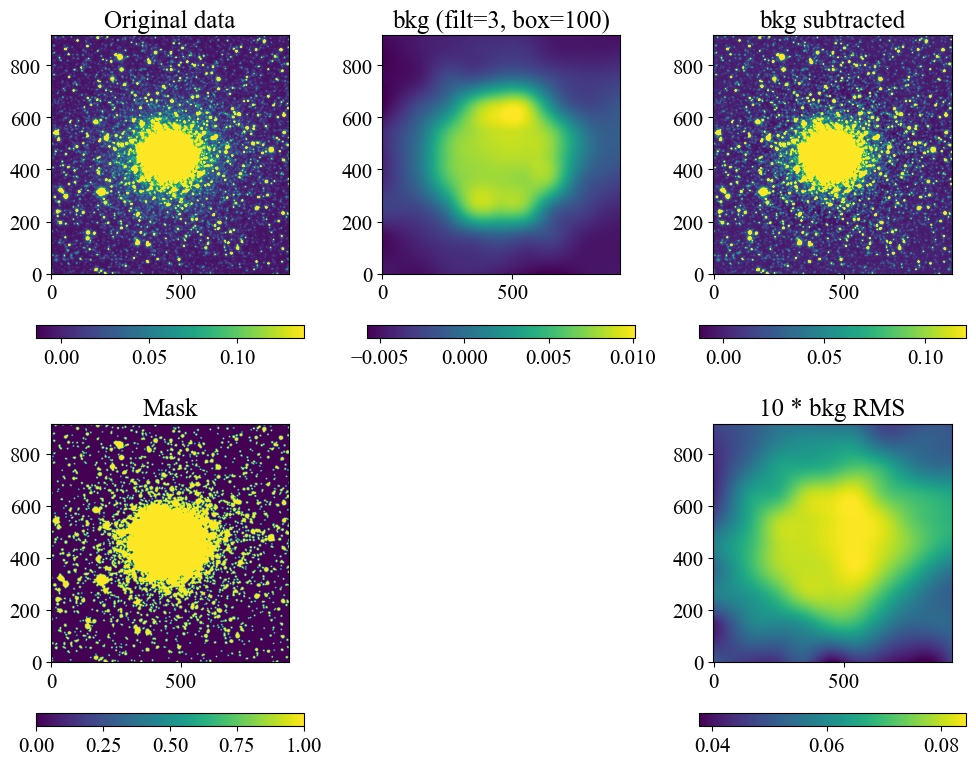

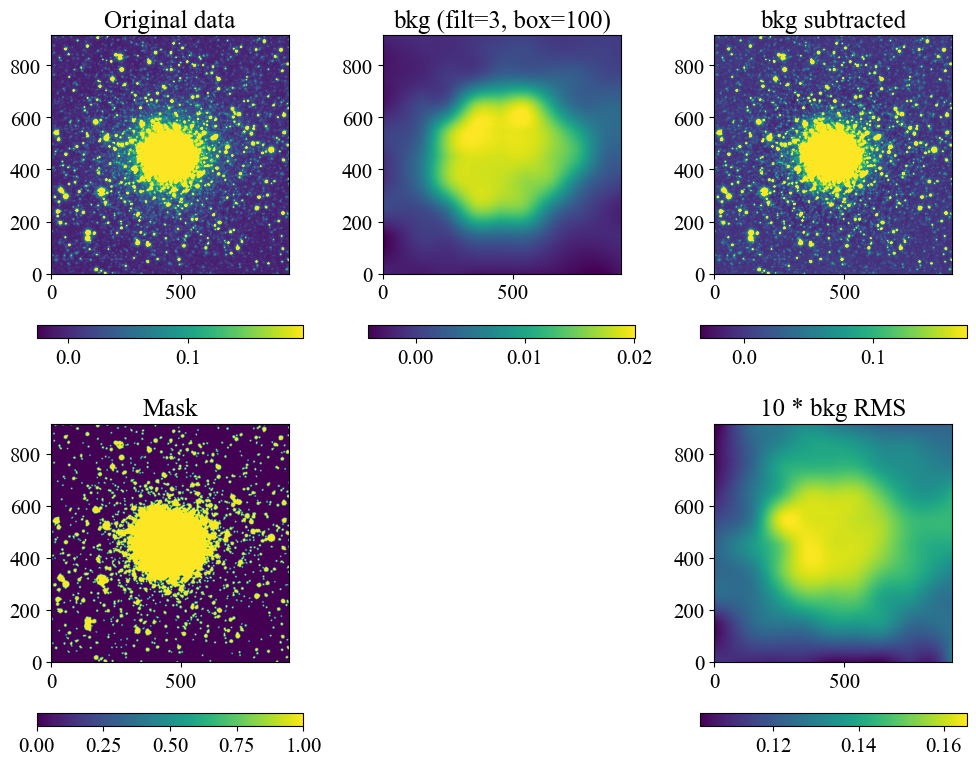

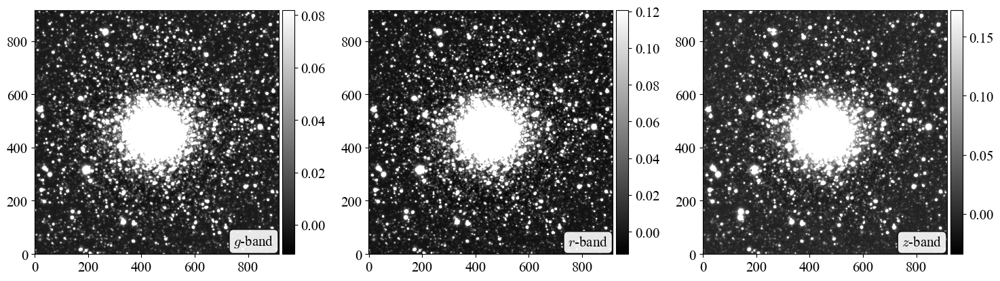

In [204]:
ccd, ccd_raw = read_sci_data(DATADIR/'NGC2210.grz.fits', bkgsubtract=True)



## 2. Selection of Stars for the PSF Estimation

number of peaks: 3780
number of stars picked: 150


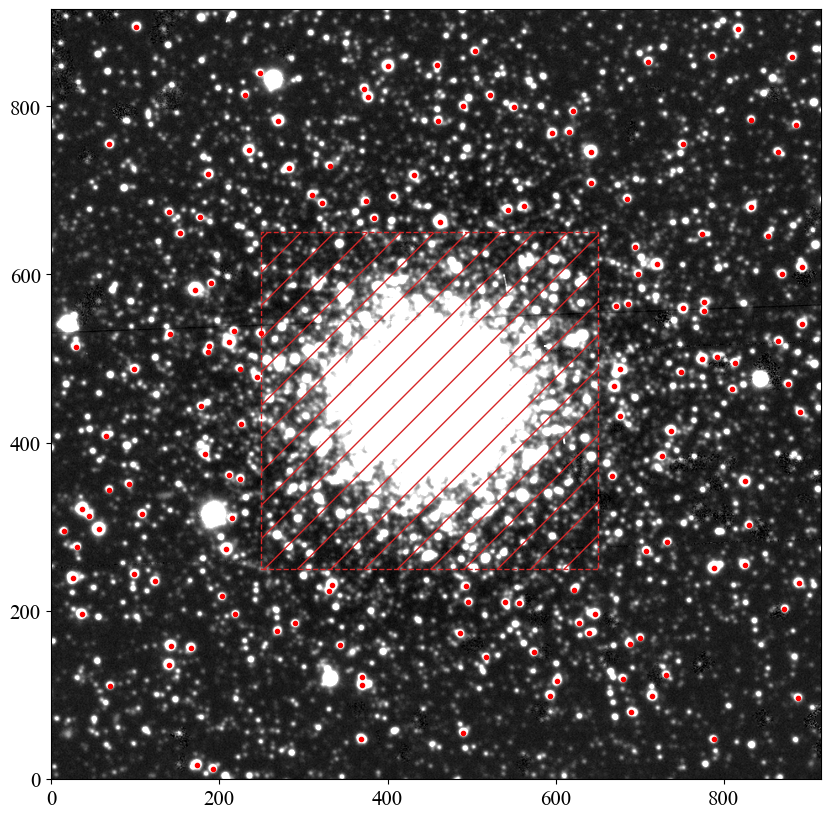

In [6]:
bands = ['g', 'r', 'z']
i = 0
band = bands[i]
data = ccd.data[i]
mask = ccd.mask[i]

bkgrms = MADStdBackgroundRMS()
std = bkgrms(data)
thres = 3*std

find_mask = np.zeros_like(data, dtype=bool)
# find_mask[250:650, 250:650] = True
# ll, hh = 0, 200
ll, hh = 250, 650
find_mask[ll:hh, ll:hh] = True
peaks_tbl = find_peaks(data, threshold=thres, mask=find_mask)
peaks_tbl['peak_value'].info.format = '%.8g'

print('number of peaks:', len(peaks_tbl))
peaks_tbl[:5].show_in_notebook()

# select stars within the cutout of specified size, which must be odd
size = 21 # typically ~4*FWHM. user should consider the PSF size for selecting this value
hsize = (size - 1) / 2
x = peaks_tbl['x_peak']  
y = peaks_tbl['y_peak']  
bound = ((x > hsize) & (x < (data.shape[1] -1 - hsize)) &
         (y > hsize) & (y < (data.shape[0] -1 - hsize)))
bright = (peaks_tbl['peak_value'] > 0.5) & (peaks_tbl['peak_value'] < 10.)

bbmask = (bound & bright)
bx, by = x[bbmask], y[bbmask]

isolated = [False if np.count_nonzero(np.sqrt((bx-xi)**2+(by-yi)**2)<size) > 1
            else True for xi, yi in zip(bx, by)]

mask_stars = isolated
mask_stars = np.ones_like(bx, dtype=bool)

stars_tbl = Table()
stars_tbl['x'] = bx[mask_stars]  
stars_tbl['y'] = by[mask_stars]

print('number of stars picked:', len(stars_tbl))
stars_tbl[:5].show_in_notebook()

nddata = NDData(data=data, mask=ccd.mask[i])

# plot the locations of our selected stars
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
im = zscale_imshow(ax, data, cmap='gray')
ax.plot(stars_tbl['x'], stars_tbl['y'], '.r')
rect = patches.Rectangle((ll,ll), hh-ll, hh-ll, ec='tab:red', ls='--',
                         hatch='/', fc='none', lw=1)
ax.add_patch(rect)

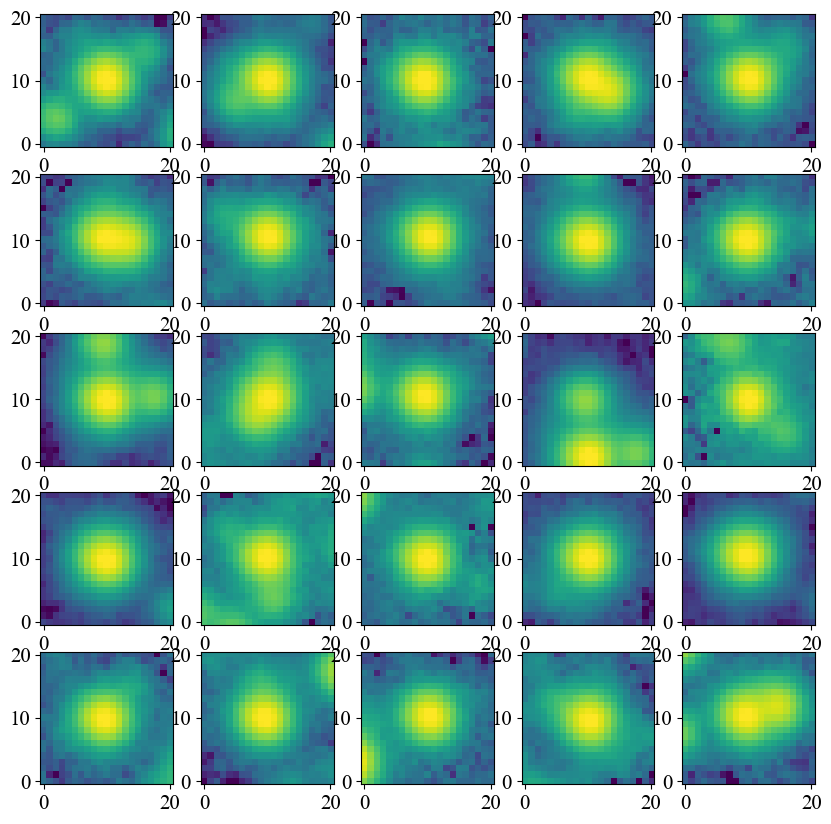

In [7]:
# extract cutouts of our selected stars
stars = extract_stars(nddata, stars_tbl, size=size)

# plot cutouts
nrows = 5
ncols = 5
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 10),
                       squeeze=True)
ax = ax.ravel()
for i in range(nrows * ncols):
    norm = simple_norm(stars[i], 'log', percent=99.0)
    ax[i].imshow(stars[i], norm=norm, origin='lower', cmap='viridis')

# derive fwhm from aperture statistics
cap = CircularAperture(stars.center_flat, size/5.)
apstat = ApertureStats(data, cap)

fwhm_mean, fwhm_med, fwhm_std = sigma_clipped_stats(apstat.fwhm.value,
                                                    sigma=3.0)



## 3. Derive Effective PSF

In [8]:

def get_epsf(stars, band,
             oversampling=4, maxiters=10, smoothing_kernel='quadratic',
             show=True, ncols=None, figsize=(10, 15)):
    
    if show:
        if ncols == None:
            n, m = figsize
            ncols = n * np.round(np.sqrt(len(stars)/n/m)).astype(int)
        nrows = int(np.ceil(len(stars)/ncols))
        fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize,
                               squeeze=True)
        axs = axs.ravel()
        for ax in axs:
            ax.axis('off')
        for i in range(len(stars)):
            norm = simple_norm(stars[i], 'log', percent=99.)
            axs[i].imshow(stars[i], norm=norm, origin='lower', cmap='viridis')
        fig.text(0.99,0.01,f'{band}-band',
                  ha='right', va='bottom', fontsize=15)
        # fig.suptitle(f'Picked stars to model PSF ({band})')
        plt.tight_layout(pad=0.3)
        
    epsf_builder = EPSFBuilder(oversampling=oversampling, maxiters=maxiters,
                               progress_bar=False,
                               smoothing_kernel=smoothing_kernel)  
    epsf, fitted_stars = epsf_builder(stars)
    
    if show:
        plt.figure()
        norm = simple_norm(epsf.data, 'log', percent=99.)
        plt.imshow(epsf.data, norm=norm, origin='lower', cmap='viridis')
        plt.title(f'Effective PSF ({band})')
        plt.colorbar()
        
    return epsf


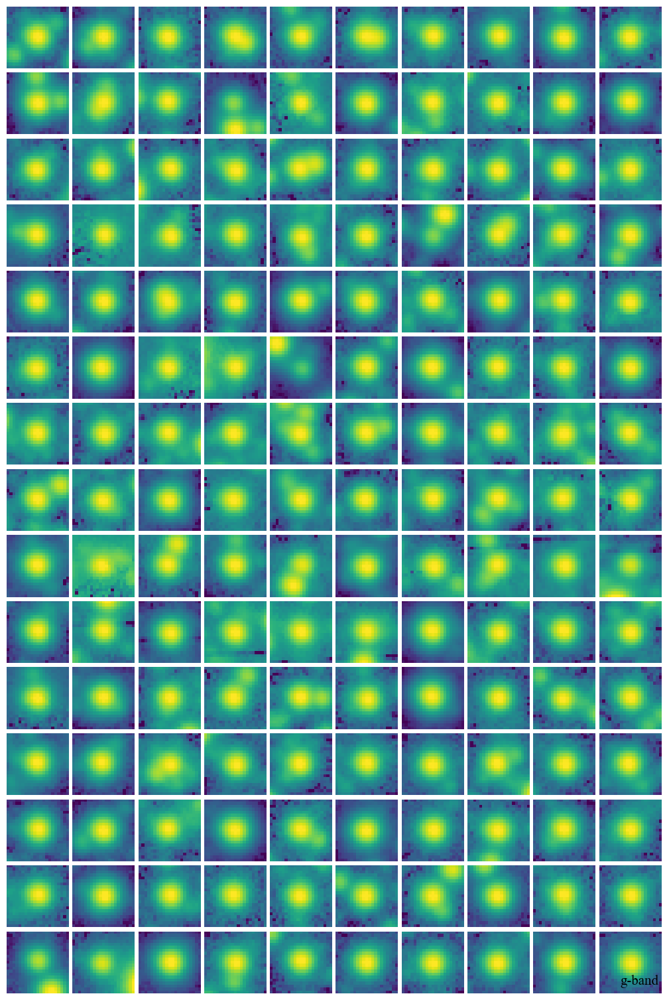

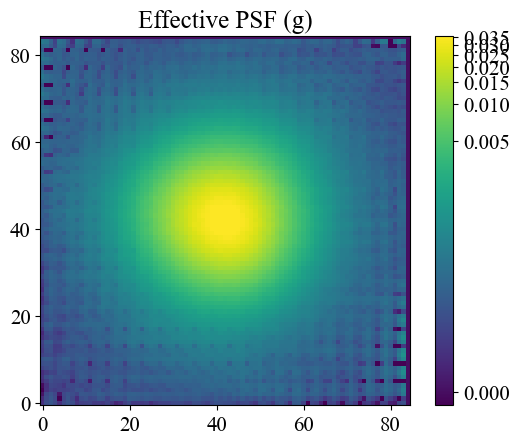

In [9]:
epsf0 = get_epsf(stars, band)

### SUBSTAR - subtract adjacent stars and reconstruct EPSF

In [10]:
# substar procedure
# subtract adjacent star profiles using the epsf model we obtained.

def get_substars(stars, psf_model, thres, fwhm, band, peakmax=None,
            show=True, ncols=10, figsize=(10, 15)):
    substars_list = []
    for star in stars:
        finder = DAOStarFinder(threshold=thres, fwhm=fwhm,
                               roundhi=5.0, roundlo=-5.0,
                               sharplo=0.0, sharphi=2.0, peakmax=peakmax)
        found = finder(star.data)
        found.rename_columns(['xcentroid', 'ycentroid', 'flux'],
                             ['x_0', 'y_0', 'flux_0'])
        if len(found) > 1:
            fitter = LevMarLSQFitter()
            y, x = np.indices(star.shape)
            xname, yname, fluxname = _extract_psf_fitting_names(psf_model)
            pars_to_set = {'x_0': xname, 'y_0': yname, 'flux_0': fluxname}
            group_psf = get_grouped_psf_model(psf_model, found, pars_to_set)
            fit_model = fitter(group_psf, x, y, star.data)
            
            if hasattr(star, 'cutout_center'):
                xc, yc = star.cutout_center
            elif hasattr(star, 'cutout_center_flat'):
                xc, yc = star.cutout_center_flat[0]
            else:
                raise AttributeError
            idx = np.argmin((found['x_0']-xc)**2+(found['y_0']-yc)**2) # crude
            cent_model = fit_model[idx]
            
            substar_data = star.data - fit_model(x, y) + cent_model(x, y)
            mask = np.ones_like(substar_data, dtype=bool)
            hsize = substar_data.shape[0]//2
            psize = int(fwhm)*2
            mask[hsize-psize:hsize+psize, hsize-psize:hsize+psize] = False
            _, med, sig = sigma_clipped_stats(substar_data[mask], sigma=2.0)
            # substar_data[substar_data < med-2*sig] = med
            substar_data = substar_data - med
            
            substar = copy.deepcopy(star)
            substar._data = substar_data
        else:
            substar = star
            
        substars_list.append(substar)
    
    substars = EPSFStars(substars_list)
    return substars

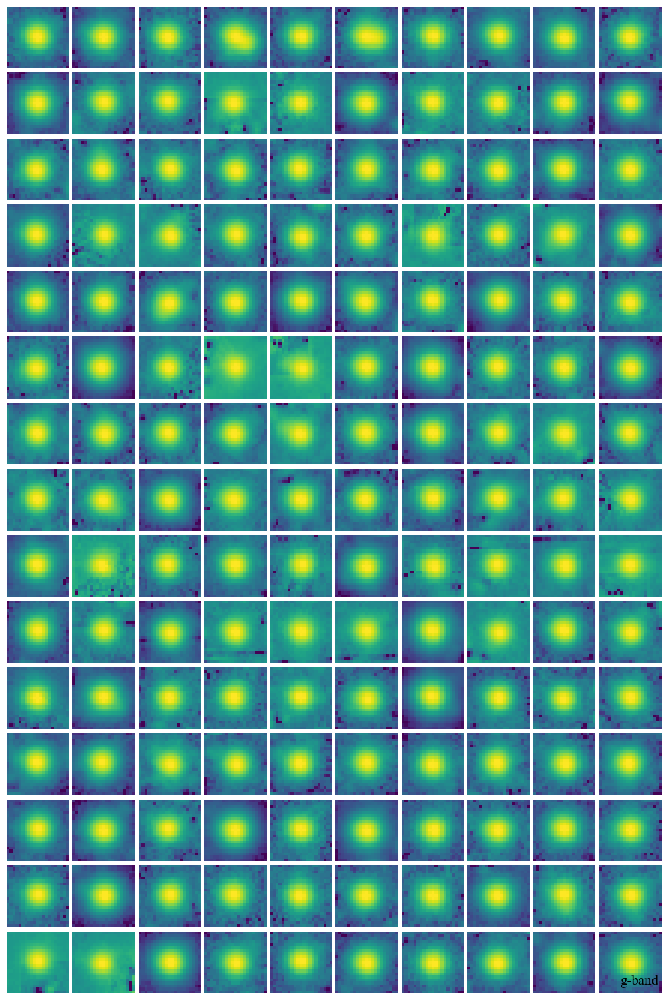

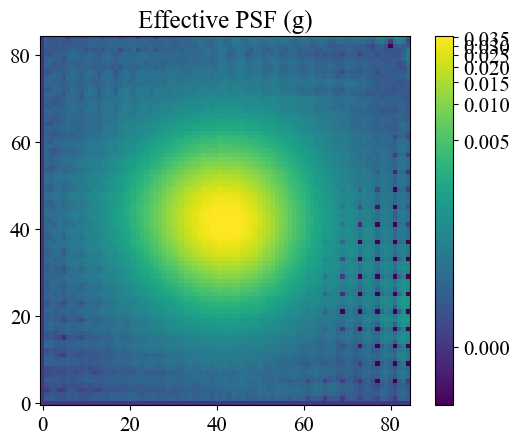

In [11]:
substars = get_substars(stars, epsf0, 2*std, fwhm_mean, band)
epsf1 = get_epsf(substars, band)

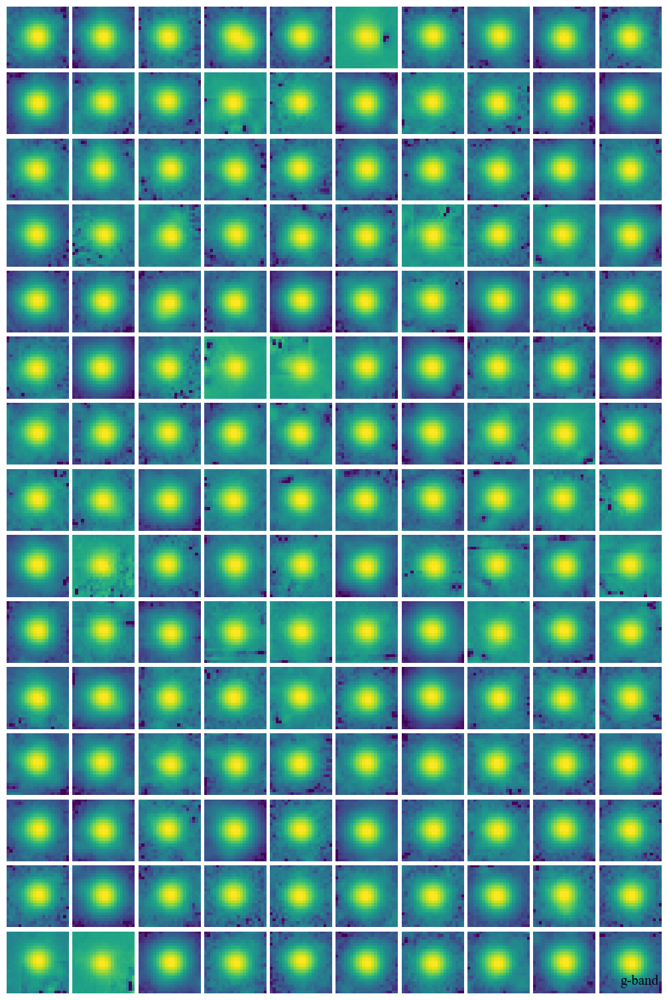

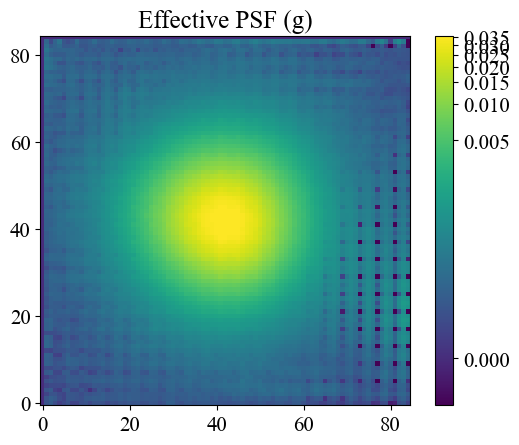

In [12]:
substars2 = get_substars(substars, epsf0, 1*std, fwhm_mean, band)
epsf2 = get_epsf(substars2, band)

## 4. PSF Photometry with the EPSF

In [13]:

def get_psfphot(data, mask, psf_model, fwhm, psf_size, sigma_thres=3.,
                peakmax=None):
    # set up the photometry object
    bkgrms = MADStdBackgroundRMS() 
    std = bkgrms(data) # background rms
    
    threshold = sigma_thres * std # threshold for star finding
    crit_separation = 2.0 * fwhm # critical separation for star grouping
    
    daogroup = DAOGroup(crit_separation) # grouping algorithm
    mmm_bkg = MMMBackground() # bkg estimator
    fitter = LevMarLSQFitter() # psf model fitter
    
    fsize = int(np.ceil(psf_size))
    fitshape = fsize if fsize%2 == 1 else fsize +1 # size of the fitting region
    
    # find stars for the initial guess
    daofind = DAOStarFinder(threshold=threshold,
                            fwhm=fwhm, #sigma_psf * gaussian_sigma_to_fwhm,
                            roundhi=5.0, roundlo=-5.0,
                            sharplo=0.0, sharphi=2.0, peakmax=peakmax)
    stars = daofind(data, mask=mask)
    
    # define the photometry object
    photometry = BasicPSFPhotometry(finder=daofind,
                                    group_maker=daogroup,
                                    bkg_estimator=mmm_bkg,
                                    psf_model=psf_model,
                                    fitter=fitter,
                                    aperture_radius=1.5*fwhm,
                                    # niters=1,
                                    fitshape=fitshape)

    # rename columns to match the names in the table
    stars.rename_columns(['xcentroid','ycentroid','flux'],
                         ['x_0', 'y_0', 'flux_0'])

    start = time() # to record the time
    print('start time -', ctime(start))
    
    # run the photometry
    result_tab = photometry.do_photometry(image=data, mask=mask,
                                          init_guesses=stars,
                                          progress_bar=True)
    residual_image = photometry.get_residual_image()
    
    finish = time()
    print('finish time -', ctime(finish))
    print(f'elapsed time - {(finish-start)/60:.2f} min')

    # discard stars outside the image
    shape = data.shape
    result_tab = discard_stars_outside(shape, result_tab)

    return result_tab, photometry


def discard_stars_outside(shape, result_tab):
    ny, nx = shape
    xin = np.logical_and(result_tab['x_fit'] > 0 , result_tab['x_fit'] < nx-1)
    yin = np.logical_and(result_tab['y_fit'] > 0 , result_tab['y_fit'] < ny-1)
    isin = np.logical_and(xin, yin)
    return result_tab[isin]



In [14]:
# set fwhm, psf_model, psf_size, sigma_thres, peakmax
fwhm = fwhm_med # median fwhm of selected stars
sigma_psf = fwhm * gaussian_fwhm_to_sigma # sigma of psf
psf_model = epsf0 # epsf model - just using the epsf without iteration
psf_size = fwhm * 4 # size of psf model to fit
sigma_thres = 5.0 # threshold for star detection
peakmax = 10.0 # maximum peak value for the detection (prevent saturated stars)

# get photometry by BasicPSFPhotometry
res = get_psfphot(data, mask, psf_model, fwhm, psf_size,
                  sigma_thres=sigma_thres, peakmax=peakmax)

result_tab, photometry = res # extract result table and photometry object
residual_image = photometry.get_residual_image() # residual_image = data-model

# save results
hdu = fits.PrimaryHDU(residual_image)
hdu.writeto(DATADIR/f'res_{band}_{sigma_thres:.1f}.fits', overwrite=True)
result_tab.write(DATADIR/f'result_tab_{band}_{sigma_thres:.1f}.csv',
                 format='csv', overwrite=True)

start time - Sun Apr  9 15:42:48 2023


Star Group:   0%|          | 0/1904 [00:00<?, ?it/s]

finish time - Sun Apr  9 15:43:36 2023
elapsed time - 0.79 min


In [15]:
def show_psfphot_result(data, band, result_tab, residual_image):
    fig, axs = plt.subplots(1, 3, figsize=(10, 4))
    interval = ZScaleInterval()
    vmin, vmax = interval.get_limits(data)
    
    zscale_imshow(axs[0], data, vmin, vmax)
    zscale_imshow(axs[1], data - residual_image, vmin, vmax)
    zscale_imshow(axs[2], residual_image, vmin, vmax)
    axs[0].plot(result_tab['x_fit'], result_tab['y_fit'], marker='+', c='r',
                ms=1, ls='None')
    axs[2].text(0.95, 0.05, f'{band}-band', ha='right', va='bottom',
                   c='w', fontweight='bold', transform=axs[2].transAxes)
    axs[0].set_title('Original')
    axs[1].set_title('Model')
    axs[2].set_title('Residual')
    axs = axs.ravel()
    for ax in axs:
        ax.axis('off')
    
    plt.tight_layout()
    
    return fig

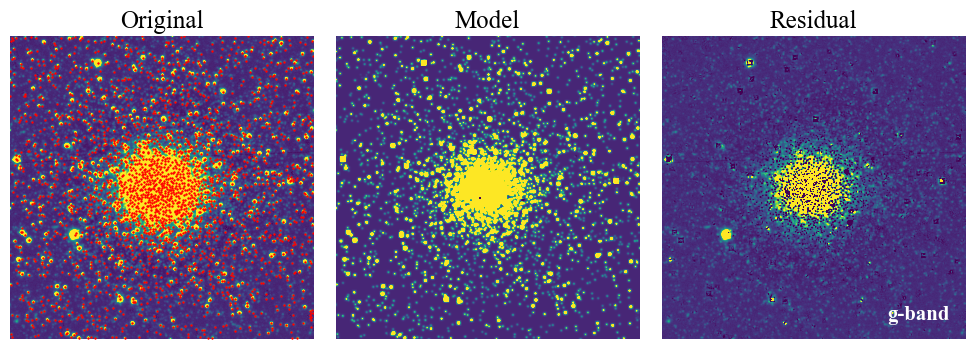

In [16]:
# plot results - data, model, residual
fig = show_psfphot_result(data, band, result_tab, residual_image)



## 5. Iterations Over All Bands


### Band: r
start time - Sun Apr  9 15:43:46 2023


Star Group:   0%|          | 0/2186 [00:00<?, ?it/s]

finish time - Sun Apr  9 15:44:41 2023
elapsed time - 0.92 min
### Band: z
start time - Sun Apr  9 15:44:49 2023


Star Group:   0%|          | 0/1257 [00:00<?, ?it/s]

finish time - Sun Apr  9 15:45:13 2023
elapsed time - 0.40 min


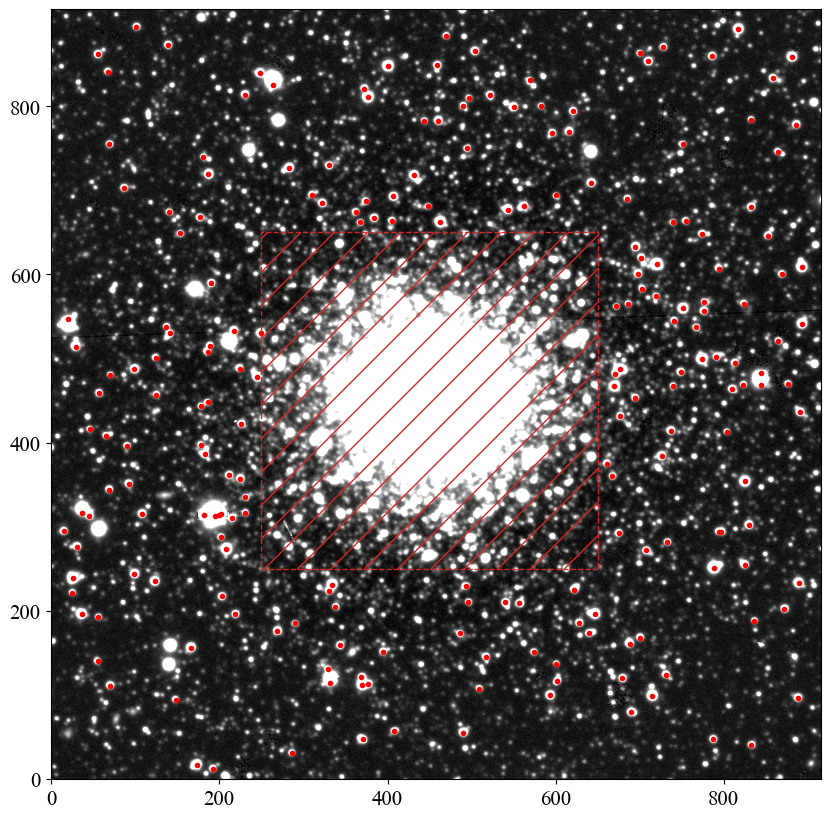

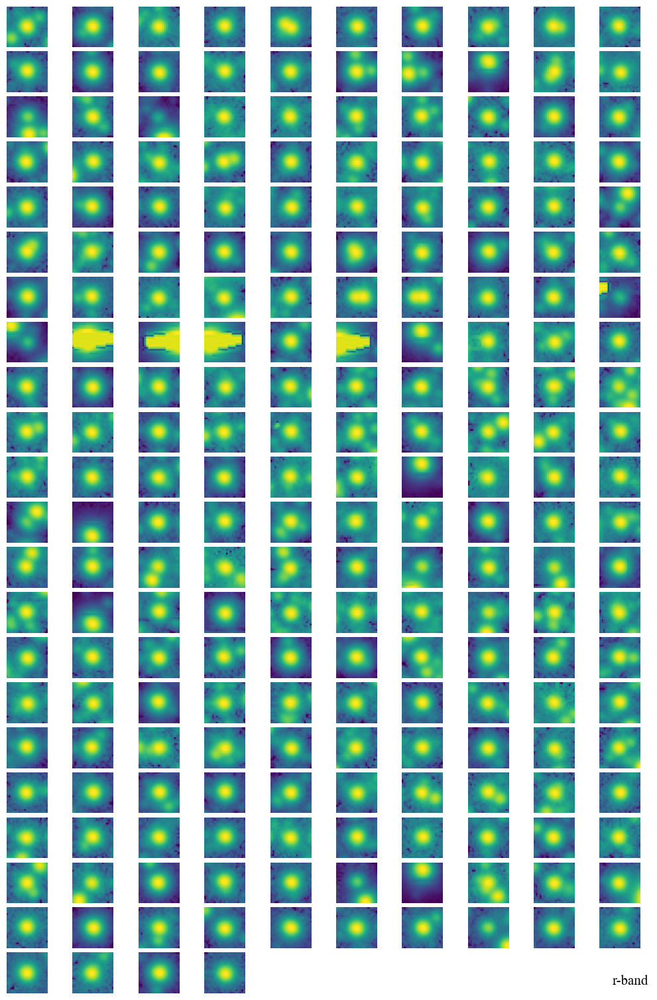

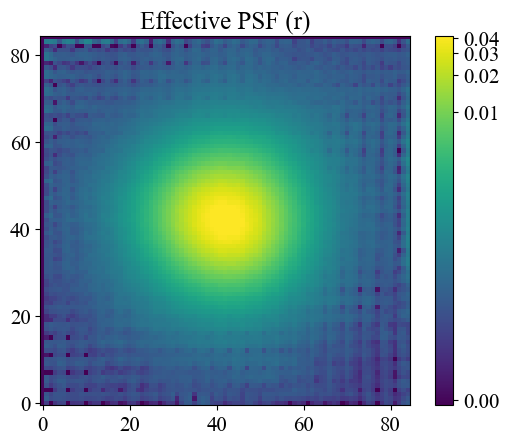

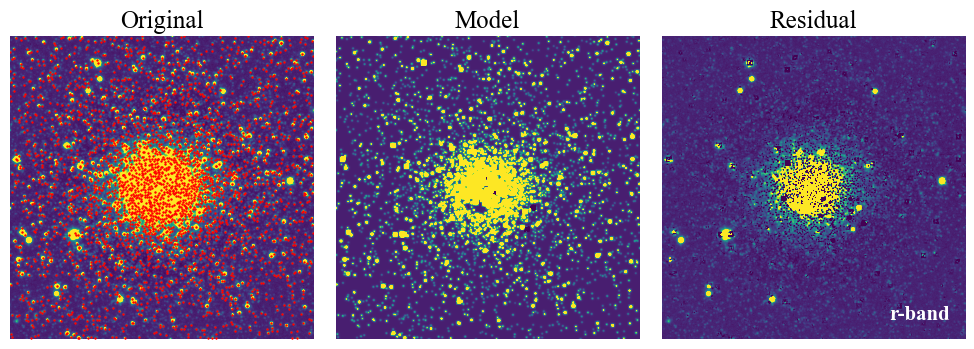

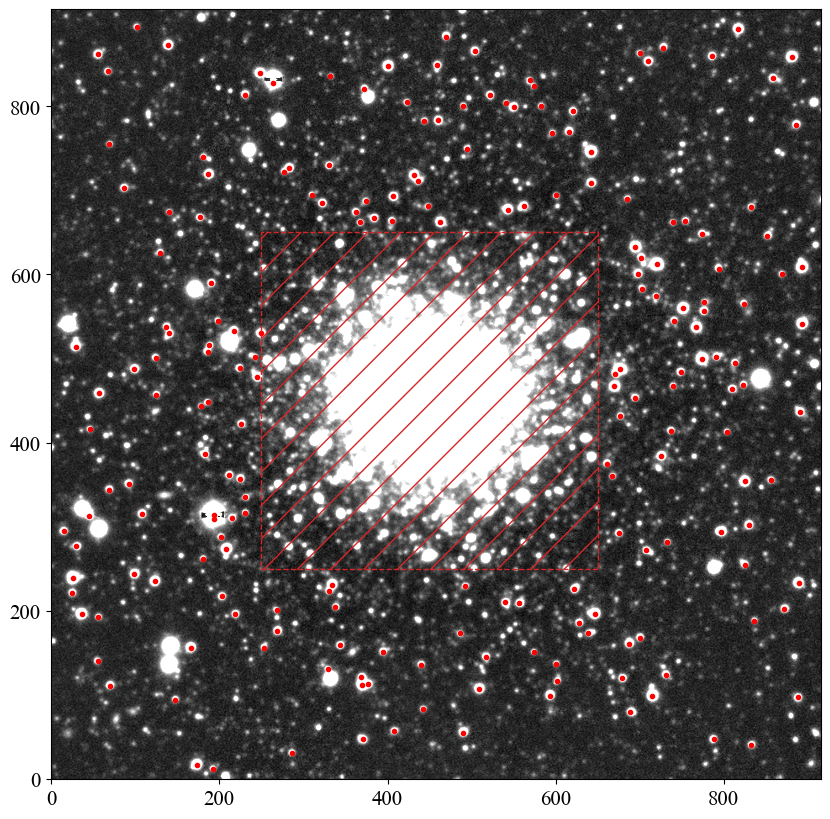

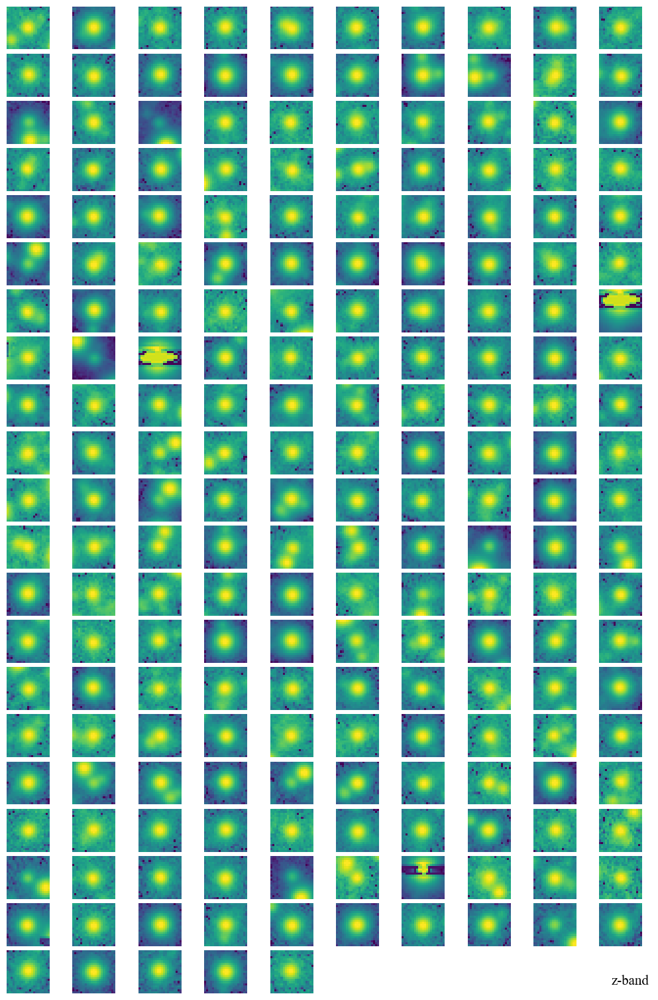

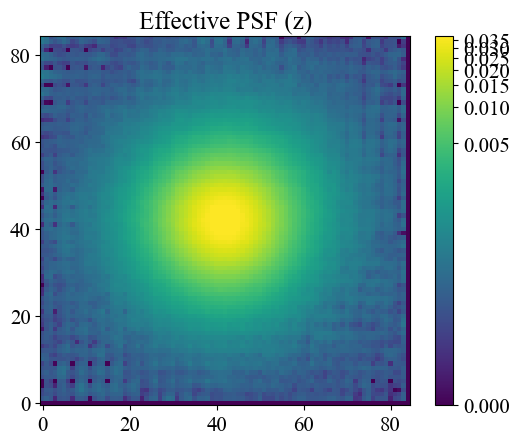

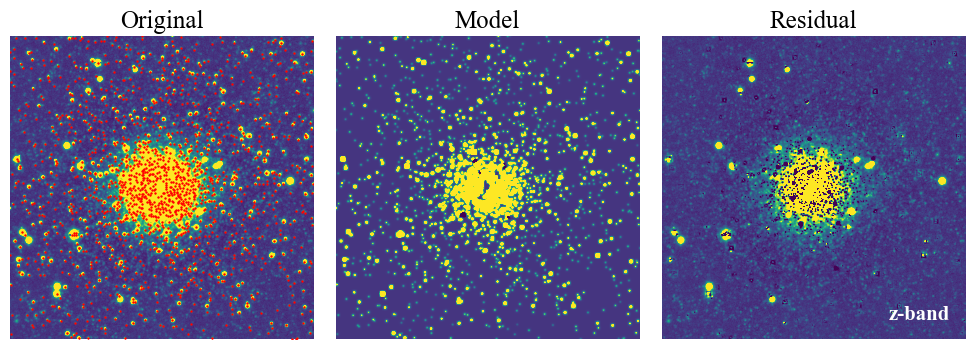

In [17]:
# Let's do the same for all bands
bands = ['g', 'r', 'z']
for i in range(1, len(bands)):
    band = bands[i]
    data = ccd.data[i]
    mask = ccd.mask[i]

    print(f'### Band: {band}')
    bkgrms = MADStdBackgroundRMS()
    std = bkgrms(data)
    thres = 3*std

    find_mask = np.zeros_like(data, dtype=bool)
    ll, hh = 250, 650
    find_mask[ll:hh, ll:hh] = True
    peaks_tbl = find_peaks(data, threshold=thres, mask=find_mask)
    peaks_tbl['peak_value'].info.format = '%.8g'

    # select stars within the cutout of specified size
    size = 21
    hsize = (size - 1) / 2
    x = peaks_tbl['x_peak']  
    y = peaks_tbl['y_peak']  
    bound = ((x > hsize) & (x < (data.shape[1] -1 - hsize)) &
            (y > hsize) & (y < (data.shape[0] -1 - hsize)))
    bright = (peaks_tbl['peak_value'] > 0.5) & (peaks_tbl['peak_value'] < 10.)

    bbmask = (bound & bright)
    bx, by = x[bbmask], y[bbmask]

    isolated = [False if np.count_nonzero(np.sqrt((bx-xi)**2+(by-yi)**2)<size) > 1
                else True for xi, yi in zip(bx, by)]

    mask_stars = isolated
    mask_stars = np.ones_like(bx, dtype=bool)

    stars_tbl = Table()
    stars_tbl['x'] = bx[mask_stars]  
    stars_tbl['y'] = by[mask_stars]

    # print(stars_tbl)

    nddata = NDData(data=data, mask=ccd.mask[i])

    # plot the locations of our selected stars
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    im = zscale_imshow(ax, data, cmap='gray')
    ax.plot(stars_tbl['x'], stars_tbl['y'], '.r')
    rect = patches.Rectangle((ll,ll), hh-ll, hh-ll, ec='tab:red', ls='--',
                            hatch='/', fc='none', lw=1)
    ax.add_patch(rect)

    # extract cutouts of our selected stars
    stars = extract_stars(nddata, stars_tbl, size=size)

    # derive fwhm from aperture statistics
    cap = CircularAperture(stars.center_flat, size/5.)
    apstat = ApertureStats(data, cap)

    fwhm_mean, fwhm_med, fwhm_std = sigma_clipped_stats(apstat.fwhm.value,
                                                        sigma=3.0)

    epsf0 = get_epsf(stars, band)
#     substars = get_substars(stars, epsf0, 2*std, fwhm_mean, band)
#     epsf1 = get_epsf(substars, band)
#     substars2 = get_substars(substars, epsf0, 1*std, fwhm_mean, band)
#     epsf2 = get_epsf(substars2, band)

    fwhm = fwhm_med
    sigma_psf = fwhm * gaussian_fwhm_to_sigma
    psf_model = epsf0
    psf_size = fwhm * 4
    sigma_thres = 5.
    peakmax=10.0

    res = get_psfphot(data, mask, psf_model, fwhm, psf_size,
                    sigma_thres=sigma_thres, peakmax=peakmax)

    result_tab, photometry = res
    residual_image = photometry.get_residual_image()

    hdu = fits.PrimaryHDU(residual_image)
    hdu.writeto(DATADIR/f'res_{band}_{sigma_thres:.1f}.fits', overwrite=True)
    result_tab.write(DATADIR/f'result_tab_{band}_{sigma_thres:.1f}.csv', format='csv', overwrite=True)

    show_psfphot_result(data, band, result_tab, residual_image)

In [18]:
# now let's bring the results together to match the stars from each band

sigma_thres = 5.0 # threshold for detection
tbls = []
for band in bands:
    tbls.append(Table.read(DATADIR/f'result_tab_{band}_{sigma_thres:.1f}.csv'))

gtbl, rtbl, ztbl = tbls # extract the tables for each band

gtbl[:5].show_in_notebook()
# gtbl.show_in_notebook(display_length=10)


idx,id,x_0,y_0,sharpness,roundness1,roundness2,npix,sky,peak,flux_0,mag,group_id,x_fit,y_fit,flux_fit,flux_unc,x_0_unc,y_0_unc
0,5,851.4579370263884,1.2441391445114005,0.36196443242858006,-0.4344867169857025,-0.6403592497808925,25,0.0,0.05986686795949936,2.6283013820648193,-1.0491879085578697,5,851.5828858179085,1.025905401368654,1.5872470402471162,0.02148962071465058,0.04129207531096741,0.04107467221826299
1,6,867.3702119779994,1.725627646602768,0.3746443460499838,-0.4643537104129791,-0.4865418576834997,25,0.0,0.13211068511009216,4.767768859863281,-1.6957879819105928,6,867.0200372418873,1.7847404094068398,4.167256405377089,0.06396622368907992,0.03574198221793129,0.04651644716231755
2,7,345.71174431452874,2.325193475559004,0.4316216844550218,-0.07001989334821701,0.07785249683595719,25,0.0,0.15541937947273254,4.847361087799072,-1.713763430572446,7,345.77063513155105,2.248777099188648,3.8344035745228986,0.016244919511704748,0.012852993593429469,0.01281332586728485
3,8,207.11302425698764,3.058786866088165,0.40544472889985034,-0.11553363502025604,-0.04160334874493719,25,0.0,0.7060717344284058,22.456912994384766,-3.3783751409838296,8,207.1732922693973,3.0009315943318207,18.168036316331744,0.09067737830057396,0.012680593306307096,0.012436143356015993
4,9,256.44454912365177,3.265457239703592,0.4094849109025853,0.07783397287130356,0.062084455045591874,25,0.0,0.04464117810130119,1.283293604850769,-0.2708150750347767,9,256.9383950895057,3.439197653368586,1.3805094546776868,0.06716545642209237,0.10555864444373801,0.12933373705447407


## 6. Match the Results of Each Band

In [19]:
# crude and slow match of the stars from each band
# for more sophisticated matching, see the exgalcosutils.catalog.match_catalogs function
# (https://github.com/hbahk/exgalcosutils/blob/d8dc13f05237bc6c21e187d3465f4b7a12cb3469/exgalcosutils/catalog.py#L16)

def dist(x1,y1,x2,y2):
    """
    Calculate the distance between two points.
    """
    return np.sqrt((x1-x2)**2+(y1-y2)**2)

def match_stars(reftab, objtab, table_names, verbose=False,
                objcard=['x_fit', 'y_fit', 'flux_fit', 'group_id'],
                refcard=['x', 'y'], rlim=1):
    """
    Return a table matched by positions of stars in each band.
    """
    tab_list = []
    for star in reftab: # for loop is slow, but it's ok for now
        xdata, ydata = objtab[objcard[0]], objtab[objcard[1]]
        match = dist(xdata, ydata, star[refcard[0]], star[refcard[1]]) < rlim
        tab = objtab[match]
        if len(tab) == 0:
            if verbose:
                print(star['ID'], ': nothing matched with the given standard star')
        else:
            if len(tab) > 1:
                if verbose:
                    print(star['ID'], ': duplication occured in the pixel match process')
                    print(tab[objcard[2], objcard[3]])
                tab.sort(objcard[2], reverse=True)
                tab = tab[0]
            tab_list.append(hstack([star, tab], table_names=table_names))
    
    matched_tab = vstack(tab_list)
    return matched_tab

In [20]:
print(f'g-band: {len(gtbl)} stars, r-band: {len(rtbl)} stars, z-band: {len(ztbl)} stars')

g-band: 2733 stars, r-band: 3309 stars, z-band: 1643 stars


In [21]:
# let's set the reference band to r-band, since it has the most stars.
# we will match the stars in the other bands to the r-band stars.
rlim = 3.0 # matching radius in pixel
grtbl = match_stars(rtbl, gtbl, ['r', 'g'], refcard=['x_fit', 'y_fit'], rlim=rlim)

grtbl[:5].show_in_notebook()
# grtbl.show_in_notebook(display_length=10)

idx,id_r,x_0_r,y_0_r,sharpness_r,roundness1_r,roundness2_r,npix_r,sky_r,peak_r,flux_0_r,mag_r,group_id_r,x_fit_r,y_fit_r,flux_fit_r,flux_unc_r,x_0_unc_r,y_0_unc_r,id_g,x_0_g,y_0_g,sharpness_g,roundness1_g,roundness2_g,npix_g,sky_g,peak_g,flux_0_g,mag_g,group_id_g,x_fit_g,y_fit_g,flux_fit_g,flux_unc_g,x_0_unc_g,y_0_unc_g
0,4,216.25053448919942,1.2949005677968173,0.3192060956525088,-0.3457149267196655,-1.3673100262786433,25,0.0,0.05218332260847092,1.2096511125564575,-0.20665032302230124,4,207.40115590672534,2.976726122548464,26.549527469046065,0.28825069683180093,0.04233953576766123,0.024340294891041676,8,207.11302425698764,3.058786866088165,0.40544472889985034,-0.11553363502025604,-0.04160334874493719,25,0.0,0.7060717344284058,22.456912994384766,-3.3783751409838296,8,207.1732922693973,3.0009315943318207,18.168036316331744,0.09067737830057396,0.012680593306307096,0.012436143356015993
1,6,851.4603718261351,1.2108594750973505,0.3799351647271139,-0.45901477336883545,-0.48058807003027026,25,0.0,0.08378846198320389,2.6939048767089844,-1.0759556411903695,6,851.4438798680471,1.0165010932338352,1.924956263908822,0.027296506104766444,0.03572467957740745,0.03505318373736652,5,851.4579370263884,1.2441391445114005,0.36196443242858006,-0.4344867169857025,-0.6403592497808925,25,0.0,0.05986686795949936,2.6283013820648193,-1.0491879085578697,5,851.5828858179085,1.025905401368654,1.5872470402471162,0.02148962071465058,0.04129207531096741,0.04107467221826299
2,7,867.3055733709494,1.693781782370741,0.4256615252588304,-0.42904403805732727,-0.40984197217986207,25,0.0,0.17511458694934845,4.53342342376709,-1.6410657106279427,7,866.9300242592316,1.783211171204607,4.6086888817071685,0.09111738082933196,0.04538398808680752,0.05364439819123745,6,867.3702119779994,1.725627646602768,0.3746443460499838,-0.4643537104129791,-0.4865418576834997,25,0.0,0.13211068511009216,4.767768859863281,-1.6957879819105928,6,867.0200372418873,1.7847404094068398,4.167256405377089,0.06396622368907992,0.03574198221793129,0.04651644716231755
3,8,345.61069273695693,2.3097940829045793,0.44636207017724444,-0.14333122968673706,-0.013896818990756205,25,0.0,0.23926955461502075,5.755198955535889,-1.9001508541447003,8,345.58843947072984,2.2756451128770494,5.213677705722488,0.025270890651765993,0.012084262372360613,0.011988322419930666,7,345.71174431452874,2.325193475559004,0.4316216844550218,-0.07001989334821701,0.07785249683595719,25,0.0,0.15541937947273254,4.847361087799072,-1.713763430572446,7,345.77063513155105,2.248777099188648,3.8344035745228986,0.016244919511704748,0.012852993593429469,0.01281332586728485
4,9,206.97901254748035,3.158943718505939,0.4442419174252964,-0.19737005233764648,-0.06358531112212965,25,0.0,1.3406963348388672,28.928308486938477,-3.6533076001702787,9,205.18482824710415,4.000238455583187,6.371106049809524,0.1939568465355741,0.08775748590315197,0.07189989158893527,8,207.11302425698764,3.058786866088165,0.40544472889985034,-0.11553363502025604,-0.04160334874493719,25,0.0,0.7060717344284058,22.456912994384766,-3.3783751409838296,8,207.1732922693973,3.0009315943318207,18.168036316331744,0.09067737830057396,0.012680593306307096,0.012436143356015993


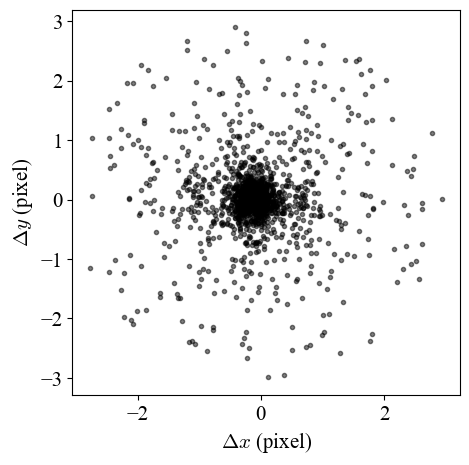

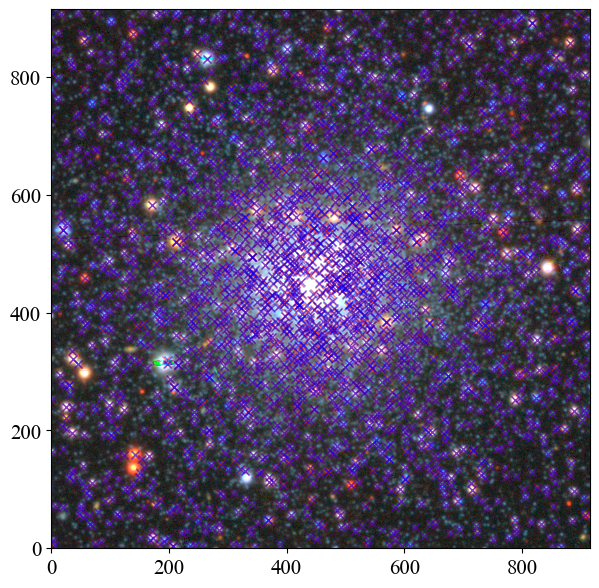

In [22]:
# let's check how well the matching went by plotting the difference of positions of the stars
# if the rlim=3.0 is too large, then try smaller value and repeat the matching process
# rlim ~< FWHM is recommended
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111)
ax.plot(grtbl['x_fit_r']-grtbl['x_fit_g'], grtbl['y_fit_r']-grtbl['y_fit_g'], '.k', alpha=0.5)
ax.set_xlabel('$\Delta x$ (pixel)')
ax.set_ylabel('$\Delta y$ (pixel)')

fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111)
rgbimg = fits.getdata(DATADIR/'NGC2210.grz.rgb.fits')
ax.imshow(rgbimg, origin='lower')
ax.plot(grtbl['x_fit_r'], grtbl['y_fit_r'], 'xr', alpha=0.5)
ax.plot(grtbl['x_fit_g'], grtbl['y_fit_g'], 'xb', alpha=0.5)



## 7. Color-Magnitude Diagram


/var/folders/c3/0f663kw90xldstvklyr5nq9c0000gn/T/ipykernel_74111/3953004836.py:4: RuntimeWarning: invalid value encountered in log10
  return -2.5*np.log10(flux) + zp


(23.0, 15.0)

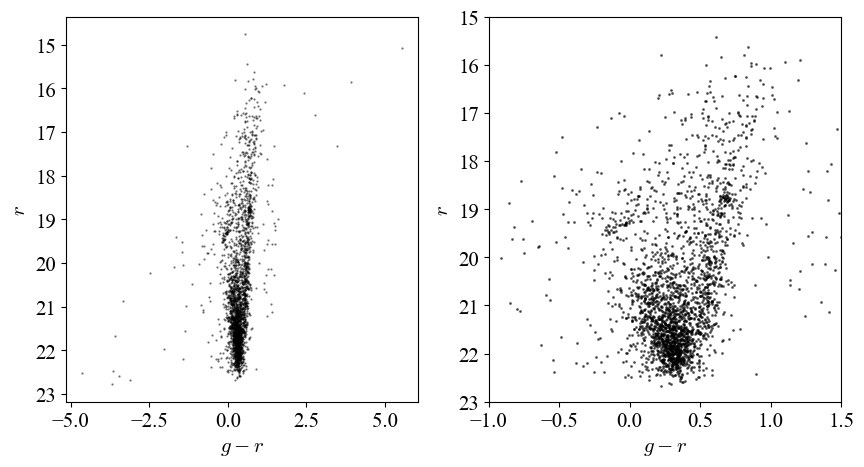

In [23]:
# then let's draw the color-magnitude diagram

def flux2mag(flux, zp=22.5): # the default zeropoint is set to 22.5 for the nanomaggy unit
    return -2.5*np.log10(flux) + zp

gmag = flux2mag(grtbl['flux_fit_g'])
rmag = flux2mag(grtbl['flux_fit_r'])

fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(121)
ax.scatter(gmag-rmag, rmag, marker='.', s=1.5, c='k', alpha=0.5)
ax.set_xlabel('$g-r$')
ax.set_ylabel('$r$')
ax.invert_yaxis()

# let's plot the color-magnitude diagram focusing on the non-outliers
ax2 = fig.add_subplot(122)
ax2.scatter(gmag-rmag, rmag, marker='.', s=5, c='k', alpha=0.5)
ax2.set_xlabel('$g-r$')
ax2.set_ylabel('$r$')
ax2.invert_yaxis()
ax2.set_xlim(-1, 1.5)
ax2.set_ylim(23, 15)



## 8. Comparison with the References

In [24]:
# let's compare the color-magnitude diagram with the legacy survey catalog
vertices = ccd.wcs.celestial.calc_footprint()
ralo, rahi = vertices[:,0].min(), vertices[:,0].max()
declo, dechi = vertices[:,1].min(), vertices[:,1].max()

lgs_url = 'https://www.legacysurvey.org/viewer/ls-dr10/cat.fits?'
cat_bbox = f'ralo={ralo:.4f}&rahi={rahi:.4f}&declo={declo:.4f}&dechi={dechi:.4f}'

query_url = lgs_url + cat_bbox
cathdu = fits.open(query_url)

cat = Table(cathdu[1].data)
cat[:5].show_in_notebook()
# cat.show_in_notebook(display_length=10)

idx,release,brickid,brickname,objid,brick_primary,maskbits,fitbits,type,ra,dec,ra_ivar,dec_ivar,bx,by,dchisq,ebv,mjd_min,mjd_max,ref_cat,ref_id,pmra,pmdec,parallax,pmra_ivar,pmdec_ivar,parallax_ivar,ref_epoch,gaia_phot_g_mean_mag,gaia_phot_g_mean_flux_over_error,gaia_phot_g_n_obs,gaia_phot_bp_mean_mag,gaia_phot_bp_mean_flux_over_error,gaia_phot_bp_n_obs,gaia_phot_rp_mean_mag,gaia_phot_rp_mean_flux_over_error,gaia_phot_rp_n_obs,gaia_phot_variable_flag,gaia_astrometric_excess_noise,gaia_astrometric_excess_noise_sig,gaia_astrometric_n_obs_al,gaia_astrometric_n_good_obs_al,gaia_astrometric_weight_al,gaia_duplicated_source,gaia_a_g_val,gaia_e_bp_min_rp_val,gaia_phot_bp_rp_excess_factor,gaia_astrometric_sigma5d_max,gaia_astrometric_params_solved,flux_g,flux_r,flux_i,flux_z,flux_w1,flux_w2,flux_w3,flux_w4,flux_ivar_g,flux_ivar_r,flux_ivar_i,flux_ivar_z,flux_ivar_w1,flux_ivar_w2,flux_ivar_w3,flux_ivar_w4,fiberflux_g,fiberflux_r,fiberflux_i,fiberflux_z,fibertotflux_g,fibertotflux_r,fibertotflux_i,fibertotflux_z,apflux_g,apflux_r,apflux_i,apflux_z,apflux_resid_g,apflux_resid_r,apflux_resid_i,apflux_resid_z,apflux_blobresid_g,apflux_blobresid_r,apflux_blobresid_i,apflux_blobresid_z,apflux_ivar_g,apflux_ivar_r,apflux_ivar_i,apflux_ivar_z,apflux_masked_g,apflux_masked_r,apflux_masked_i,apflux_masked_z,apflux_w1,apflux_w2,apflux_w3,apflux_w4,apflux_resid_w1,apflux_resid_w2,apflux_resid_w3,apflux_resid_w4,apflux_ivar_w1,apflux_ivar_w2,apflux_ivar_w3,apflux_ivar_w4,mw_transmission_g,mw_transmission_r,mw_transmission_i,mw_transmission_z,mw_transmission_w1,mw_transmission_w2,mw_transmission_w3,mw_transmission_w4,nobs_g,nobs_r,nobs_i,nobs_z,nobs_w1,nobs_w2,nobs_w3,nobs_w4,rchisq_g,rchisq_r,rchisq_i,rchisq_z,rchisq_w1,rchisq_w2,rchisq_w3,rchisq_w4,fracflux_g,fracflux_r,fracflux_i,fracflux_z,fracflux_w1,fracflux_w2,fracflux_w3,fracflux_w4,fracmasked_g,fracmasked_r,fracmasked_i,fracmasked_z,fracin_g,fracin_r,fracin_i,fracin_z,ngood_g,ngood_r,ngood_i,ngood_z,anymask_g,anymask_r,anymask_i,anymask_z,allmask_g,allmask_r,allmask_i,allmask_z,wisemask_w1,wisemask_w2,psfsize_g,psfsize_r,psfsize_i,psfsize_z,psfdepth_g,psfdepth_r,psfdepth_i,psfdepth_z,galdepth_g,galdepth_r,galdepth_i,galdepth_z,nea_g,nea_r,nea_i,nea_z,blob_nea_g,blob_nea_r,blob_nea_i,blob_nea_z,psfdepth_w1,psfdepth_w2,psfdepth_w3,psfdepth_w4,wise_coadd_id,wise_x,wise_y,lc_flux_w1,lc_flux_w2,lc_flux_ivar_w1,lc_flux_ivar_w2,lc_nobs_w1,lc_nobs_w2,lc_fracflux_w1,lc_fracflux_w2,lc_rchisq_w1,lc_rchisq_w2,lc_mjd_w1,lc_mjd_w2,lc_epoch_index_w1,lc_epoch_index_w2,sersic,sersic_ivar,shape_r,shape_r_ivar,shape_e1,shape_e1_ivar,shape_e2,shape_e2_ivar
0,10000,21606,0928m692,3632,True,8192,129,PSF,92.78757007578037,-69.12959365210126,62271860000000.0,99642075000000.0,1867.9648,3453.933,143652.3 .. 0.0,0.072651625,57283.31326590667,59268.07856435075,GE,5279742686399885312,1.3109009,1.4812818,-0.070761435,2.3821611,5.770945,5.594181,2016.0,20.15112,192.3021,270,20.435118,18.27049,0,19.89739,12.570855,0,False,1.1294675,0.91282725,0,0,0.0,False,0.0,0.0,1.0900487,0.91672444,31,8.298511,8.945159,8.487956,8.432867,0.0,0.0,0.0,0.0,877.3331,718.1057,268.16235,90.84242,0.0,0.0,0.0,0.0,6.4651184,6.968902,6.6127095,6.569791,6.4646473,6.9683943,6.612228,6.569312,2.498601 .. 18.798218,3.2165787 .. 27.84321,2.270678 .. 25.20499,2.5010936 .. 27.251497,-0.094051026 .. 6.24606,-0.1272347 .. 11.613896,-0.034183294 .. 8.227281,-0.013881785 .. 9.485866,-0.094051026 .. 6.24606,-0.1272347 .. 11.613896,-0.034183294 .. 8.227281,-0.013881785 .. 9.485866,4302.66 .. 26.097149,2988.5078 .. 31.565092,1799.0396 .. 9.936828,550.3695 .. 2.77558,0.0 .. 0.0,0.0 .. 0.0,0.0 .. 0.0,0.0 .. 0.0,0.47616625 .. 2.2627623,0.34674054 .. 4.482998,-1.2738854 .. -13.678328,-1.0870681 .. -34.920433,0.46386555 .. 2.095589,0.34032154 .. 4.3984013,-1.2854753 .. -13.803032,-1.0955067 .. -35.15571,89.92067 .. 7.042809,21.144802 .. 1.5757307,0.3320874 .. 0.024630265,0.012552651 .. 0.0009306426,0.8064902,0.8651346,0.8989498,0.9221627,0.98776317,0.99246716,0.998

/var/folders/c3/0f663kw90xldstvklyr5nq9c0000gn/T/ipykernel_74111/3953004836.py:4: RuntimeWarning: invalid value encountered in log10
  return -2.5*np.log10(flux) + zp


(23.0, 15.0)

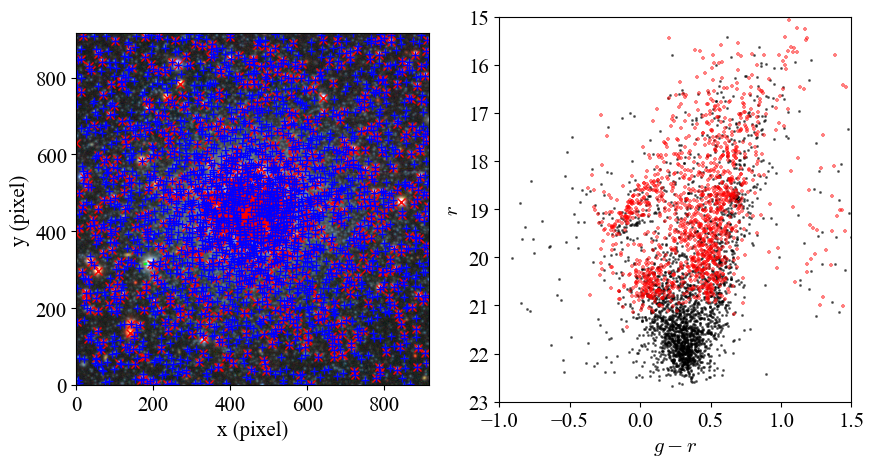

In [25]:
gcat = flux2mag(cat['flux_g']) # nanomaggy to magnitude
rcat = flux2mag(cat['flux_r'])

xcat, ycat = ccd.wcs.celestial.all_world2pix(cat['ra'], cat['dec'], 0)
cat['x'] = xcat
cat['y'] = ycat

fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(121)
ax.imshow(rgbimg, origin='lower')
ax.plot(xcat, ycat, 'xr')
ax.plot(grtbl['x_fit_g'], grtbl['y_fit_g'], '+b')
ax.set_xlabel('x (pixel)')
ax.set_ylabel('y (pixel)')
ax.set_xlim(0, len(rgbimg[0]))

ax2 = fig.add_subplot(122)
ax2.scatter(gmag-rmag, rmag, marker='.', s=5, c='k', alpha=0.5)
ax2.scatter(gcat-rcat, rcat, marker='+', s=5, c='r', alpha=0.5)
ax2.set_xlabel('$g-r$')
ax2.set_ylabel('$r$')
ax2.invert_yaxis()
ax2.set_xlim(-1, 1.5)
ax2.set_ylim(23, 15)


In [26]:
# let's match the stars in the catalog with the stars of our photometry
cmtbl_r = match_stars(rtbl, cat, ['our', 'cat'], refcard=['x_fit', 'y_fit'],
                    objcard=['x', 'y', 'flux_r'], rlim=rlim)

/var/folders/c3/0f663kw90xldstvklyr5nq9c0000gn/T/ipykernel_74111/3953004836.py:4: RuntimeWarning: invalid value encountered in log10
  return -2.5*np.log10(flux) + zp


Text(0.95, 0.05, 'offset = 0.15\n scatter = 0.49')

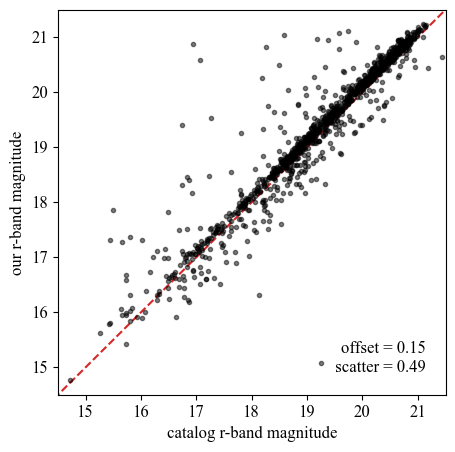

In [182]:
# and compare the magnitude
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111)
crmag = flux2mag(cmtbl_r['flux_r']) # catalog r-band magnitude
ormag = flux2mag(cmtbl_r['flux_fit']) # our r-band magnitude
ax.plot(crmag, ormag, '.k', alpha=0.5)
ax.set_ylim([14.5, 21.5])
ax.set_xlim([14.5, 21.5])
ax.plot([14, 22], [14, 22], ls='--', c='tab:red', zorder=0)
ax.set_xlabel('catalog r-band magnitude')
ax.set_ylabel('our r-band magnitude')

diff = ormag - crmag
offset, scatter = np.nanmean(diff), np.nanstd(diff)

ax.text(0.95, 0.05, f'offset = {offset:.2f}\n scatter = {scatter:.2f}',
        transform=ax.transAxes, va='bottom', ha='right')

In [28]:
# doing the same thing in gz-band
cmtbl_g = match_stars(gtbl, cat, ['our', 'cat'], refcard=['x_fit', 'y_fit'],
                      objcard=['x', 'y', 'flux_g'], rlim=rlim)
cmtbl_z = match_stars(ztbl, cat, ['our', 'cat'], refcard=['x_fit', 'y_fit'],
                      objcard=['x', 'y', 'flux_z'], rlim=rlim)

/var/folders/c3/0f663kw90xldstvklyr5nq9c0000gn/T/ipykernel_74111/3953004836.py:4: RuntimeWarning: invalid value encountered in log10
  return -2.5*np.log10(flux) + zp


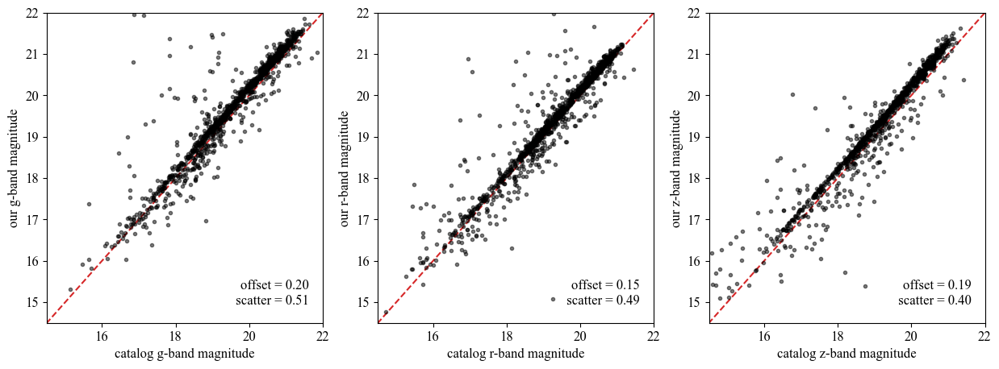

In [183]:
fig, axes = plt.subplots(1, 3, figsize=(15,5))
cgmag = flux2mag(cmtbl_g['flux_g']) # catalog g-band magnitude
ogmag = flux2mag(cmtbl_g['flux_fit']) # our g-band magnitude
czmag = flux2mag(cmtbl_z['flux_z']) # catalog z-band magnitude
ozmag = flux2mag(cmtbl_z['flux_fit']) # our z-band magnitude
for ax, cmag, omag, band in zip(axes, [cgmag, crmag, czmag],
                                [ogmag, ormag, ozmag], ['g', 'r', 'z']):
    ax.plot(cmag, omag, '.k', alpha=0.5)
    ax.set_ylim([14.5, 22])
    ax.set_xlim([14.5, 22])
    ax.plot([14, 22], [14, 22], ls='--', c='tab:red', zorder=0)
    ax.set_xlabel(f'catalog {band}-band magnitude')
    ax.set_ylabel(f'our {band}-band magnitude')
    
    diff = omag - cmag
    offset, scatter = np.nanmean(diff), np.nanstd(diff)

    ax.text(0.95, 0.05, f'offset = {offset:.2f}\n scatter = {scatter:.2f}',
            transform=ax.transAxes, va='bottom', ha='right')

There are systematic offsets between cataloged magnitude and our PSF magnitude,
for each band. What made these offsets? Who derived more correct result? There
are many possible reasons of the offsets one can think of:
* Difference in aperture correction process between our method and `Tractor`,
  which is the tool for extracting PSF magnitude in DESI Legacy Survey catalog.
* Difference in PSF model - only a percent level error in PSF model can 10~100\%
  errors of the faint star near the bright stars. The systematic offset in PSF
  model can derive the systematic offsets in the magnitude.
* Difference in the background subtraction
* And many more -

One possible way to resolve the cause of the offset is compare the PSF
photometry at the un-crowded field, to find out how the crowding affects the
resulting magnitudes. Another way is simulate a star inside the image and
repeat the photometry over, and compare the input with the magnitudes from the
PSF photometry, which is called *the artificial star test*.

I will leave this task to the reader.

***

To compare with another reference with the $BV$ magnitude, we need a
transformation relation of our $gr$ magnitude into $BV$ magnitude.


Transformation from DECam $griz$ to Johnson-Cousins ($UBV R_C I_C$) system
* [DES Photometric Transformations](https://des.ncsa.illinois.edu/releases/dr2/dr2-docs/dr2-transformations)

$$B = g_{\rm DES} + 0.371 (g-r)_{\rm DES} + 0.197 \ \ [-0.5 < (g-r)_{\rm DES} ≤ 0.2] \ \ ({\rm RMS}: 0.022 {\rm mag})$$
$$B = g_{\rm DES} + 0.542 (g-r)_{\rm DES} + 0.141 \ \ [ 0.2 < (g-r)_{\rm DES} ≤ 0.7] \ \ ({\rm RMS}: 0.017 {\rm mag})$$
$$B = g_{\rm DES} + 0.454 (g-r)_{\rm DES} + 0.200 \ \ [ 0.7 < (g-r)_{\rm DES} ≤ 1.8] \ \ ({\rm RMS}: 0.059 {\rm mag})$$
$$V = g_{\rm DES} - 0.465 (g-r)_{\rm DES} - 0.020 \ \ [-0.5 < (g-r)_{\rm DES} ≤ 0.2] \ \ ({\rm RMS}: 0.012 {\rm mag})$$
$$V = g_{\rm DES} - 0.496 (g-r)_{\rm DES} - 0.015 \ \ [ 0.2 < (g-r)_{\rm DES} ≤ 0.7] \ \ ({\rm RMS}: 0.011 {\rm mag})$$
$$V = g_{\rm DES} - 0.445 (g-r)_{\rm DES} - 0.062 \ \ [ 0.7 < (g-r)_{\rm DES} ≤ 1.8] \ \ ({\rm RMS}: 0.024 {\rm mag})$$

In [30]:
def Bmag(gmag, rmag):
    B = np.zeros_like(gmag)
    gmr = gmag - rmag
    blu = (gmr > -0.5) & (gmr <= 0.2)
    grn = (gmr > 0.2) & (gmr <= 0.7)
    red = (gmr > 0.7) & (gmr <= 1.8)
    B[blu] = gmag[blu] + 0.371*gmr[blu] + 0.197
    B[grn] = gmag[grn] + 0.542*gmr[grn] + 0.141
    B[red] = gmag[red] + 0.454*gmr[red] + 0.200
    return B

def Vmag(gmag, rmag):
    V = np.zeros_like(gmag)
    gmr = gmag - rmag
    blu = (gmr > -0.5) & (gmr <= 0.2)
    grn = (gmr > 0.2) & (gmr <= 0.7)
    red = (gmr > 0.7) & (gmr <= 1.8)
    V[blu] = gmag[blu] - 0.465*gmr[blu] - 0.020
    V[grn] = gmag[grn] - 0.496*gmr[grn] - 0.015
    V[red] = gmag[red] - 0.445*gmr[red] - 0.062
    return V

B, V = Bmag(gmag, rmag), Vmag(gmag, rmag)

# let's compare the color-magnitude diagram of ours to the reference
# reference: Peter Stetson's stellar standards and software - Homogeneous photometry
# one can download the data from https://www.cadc.hia.nrc.gc.ca/en/community/STETSON/homogeneous/

# read the reference data
reftbl = Table.read(DATADIR/'stetson'/'NGC2210.dat', format='ascii.fixed_width_two_line')

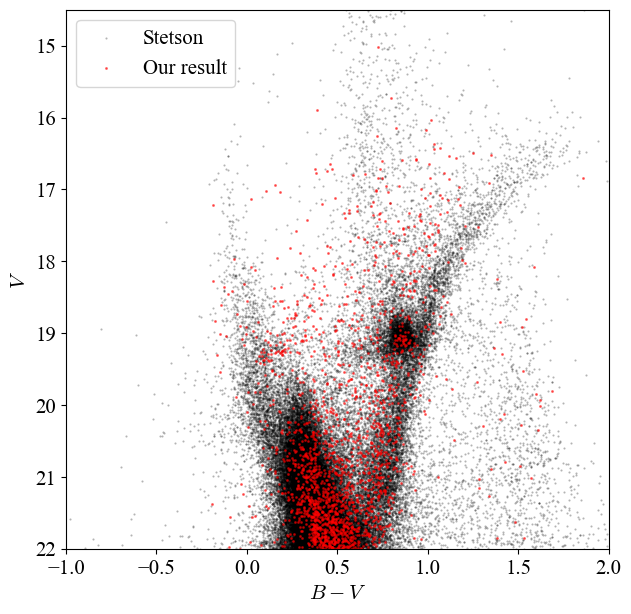

In [31]:
# plot the color-magnitude diagram
fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111)
ax.scatter(reftbl['B']-reftbl['V'], reftbl['V'], marker='.', s=1, c='k', alpha=0.3, label='Stetson')
ax.scatter(B-V, V, marker='.', s=5, c='r', alpha=0.5, label='Our result')
ax.set_ylim([14.5, 22])
ax.set_xlim([-1, 2])
ax.set_xlabel('$B-V$')
ax.set_ylabel('$V$')
ax.invert_yaxis()
ax.legend()


From the color-magnitude diagram we obtained, what properties of this system
will you be able to find out?
* Properties of stars inside this field
* Properties of the globular cluster NGC 2210
* Is our photometry reliable?
* etc


## Further Readings

* [Stetson (1987PASP...99..191S)](https://ui.adsabs.harvard.edu/abs/1987PASP...99..191S/abstract), DAOPHOT: A Computer Program for Crowded-Field Stellar Photometry
    
    Seminal paper about how to find stars and do photometry from a CCD image over crowded field

* [Anderson & King (2000PASP..112.1360A)](https://ui.adsabs.harvard.edu/abs/2000PASP..112.1360A/abstract), Toward High-Precision Astrometry with WFPC2. I. Deriving an Accurate Point-Spread Function

    This work describes how the effective point-spread function is estimated.

* [Stetson et al. (2019MNRAS.485.3042S)](https://ui.adsabs.harvard.edu/abs/2019MNRAS.485.3042S/abstract), Homogeneous photometry - VII. Globular clusters in the Gaia era

    Modern homogeneous photometry given by Peter Stetson, especially for the globular clusters, by conduting the PSF photometry.

* [Baumgardt et al. (2023MNRAS.tmp..617B)](https://ui.adsabs.harvard.edu/abs/2023MNRAS.tmp..617B/abstract), Evidence for a bottom-light initial mass function in massive star clusters 

    This reference may gave you some idea about how member stars in a cluster can be identified.